# Stage 2 - SegFormer-B0 Semantic Segmentation

Trains a segmentation model on the annotated prawn + tuna polygon masks,
reusing Stage 1's held-out negative controls as "no target" examples, and
scores the result against the two human-agreement IoU ceilings already
established (58.67% prawn, 72.04% tuna).

**Datasets used (all local paths — update if yours differ):**
- Prawn annotated images: `Stage_02/prawn_annotation_training/images/default`
- Tuna annotated images: `Stage_02/tuna_annotation_training/images/default`
- Stage 1 negative controls: `Stage_01/data/normal_sea/heldout_split`
- `stage1_final_config.json` and `stage1_bucket_ref.pkl` — copy these into your Stage_02 working folder
- The four COCO JSON exports (prawn t1/t2, tuna t1/t2) — copy these into your Stage_02 working folder too

**Environment note:** given the dependency issues hit during Stage 1, it's worth creating a **separate,
dedicated environment** for this deep-learning stage rather than reusing `base` or the `marine-anomaly`
environment from Stage 1:
```bash
conda create -n marine-stage2 python=3.11 -y
conda activate marine-stage2
pip install torch torchvision --index-url https://download.pytorch.org/whl/cpu
# If you have an NVIDIA GPU, use the CUDA wheel instead of the line above - see pytorch.org/get-started
pip install transformers pillow numpy scipy scikit-image matplotlib notebook ipykernel
python -m ipykernel install --user --name marine-stage2 --display-name "Python (marine-stage2)"
```
Verify before opening this notebook:
```bash
python -c "import torch, transformers, PIL, numpy; print('all good')"
```

In [1]:
# --- Cell 1: Imports and config ---
import json
import pickle
import random
from pathlib import Path

import numpy as np
from PIL import Image, ImageDraw

# --- Paths: update these to match your machine ---
PRAWN_IMG_DIR = Path(r"C:\Users\bcura\AI PostGrad Project\Saqqara-Marine-Anomaly-Detection\Stage_02\prawn_annotation_training\images\default")
TUNA_IMG_DIR  = Path(r"C:\Users\bcura\AI PostGrad Project\Saqqara-Marine-Anomaly-Detection\Stage_02\tuna_annotation_training\images\default")
NEGATIVE_DIR  = Path(r"C:\Users\bcura\AI PostGrad Project\Saqqara-Marine-Anomaly-Detection\Stage_01\data\normal_sea\heldout_split")

# --- Annotation JSON files: copy these into your Stage_02 working folder ---
PRAWN_T1_JSON = Path("prawn_instances_default_t1.json")   # 25 images, your annotations
PRAWN_T2_JSON = Path("prawn_instances_default_t2.json")   # 10 images, teammate's independent annotations
TUNA_T1_JSON  = Path("tuna_instances_default_t1.json")    # 26 images, your annotations
TUNA_T2_JSON  = Path("tuna_instances_default_t2.json")    # 10 images, teammate's independent annotations

# --- Stage 1 handoff files: copy these into your Stage_02 working folder ---
STAGE1_CONFIG_PATH = Path("stage1_final_config.json")
STAGE1_BUCKET_REF_PATH = Path("stage1_bucket_ref.pkl")

with open(STAGE1_CONFIG_PATH) as f:
    stage1_config = json.load(f)
with open(STAGE1_BUCKET_REF_PATH, "rb") as f:
    stage1_bucket_ref = pickle.load(f)

IMG_SIZE = tuple(stage1_config["img_size"])   # (512, 512) - reuse Stage 1's exact resize target
print(f"Stage 1 config loaded. IMG_SIZE = {IMG_SIZE}")
print(f"Stage 1 false-positive rate: {stage1_config['false_positive_rate']:.2%}")

# --- Human-agreement IoU ceilings, established during annotation (for scoring later) ---
PRAWN_IOU_CEILING = 0.5867
TUNA_IOU_CEILING = 0.7204

# --- Training config ---
N_HELDOUT_PER_DATASET = 10     # matches the double-annotation overlap size, reserved for evaluation only
N_NEGATIVES_TO_USE = 437       # use all available Stage 1 negative controls
BATCH_SIZE = 4
NUM_EPOCHS = 30
LEARNING_RATE = 6e-5
SEGFORMER_CHECKPOINT = "nvidia/segformer-b0-finetuned-ade-512-512"
OUTPUT_DIR = Path("stage2_output")
OUTPUT_DIR.mkdir(exist_ok=True)

random.seed(42)
np.random.seed(42)

Stage 1 config loaded. IMG_SIZE = (512, 512)
Stage 1 false-positive rate: 11.90%


In [2]:
# --- Cell 2: Load and merge the COCO annotation JSONs ---
# Dataset used: all four annotation JSONs (prawn t1/t2, tuna t1/t2).
# t1 = your annotations (25 prawn, 26 tuna). t2 = teammate's independent
# annotations on a 10-image subset of each - used ONLY for evaluation,
# never for training, per the Stage 2 workflow plan.

def load_coco(path):
    with open(path) as f:
        return json.load(f)

def coco_to_records(coco, img_dir, dataset_name):
    """Returns a list of {path, width, height, segmentations, dataset} dicts, one per image."""
    img_by_id = {img["id"]: img for img in coco["images"]}
    segs_by_image = {img["id"]: [] for img in coco["images"]}
    for ann in coco["annotations"]:
        segs_by_image[ann["image_id"]].extend(ann["segmentation"])
    records = []
    for img_id, img in img_by_id.items():
        records.append({
            "path": img_dir / img["file_name"],
            "filename": img["file_name"],
            "width": img["width"],
            "height": img["height"],
            "segmentations": segs_by_image[img_id],
            "dataset": dataset_name,
        })
    return records

prawn_t1 = coco_to_records(load_coco(PRAWN_T1_JSON), PRAWN_IMG_DIR, "prawn")
prawn_t2 = coco_to_records(load_coco(PRAWN_T2_JSON), PRAWN_IMG_DIR, "prawn")
tuna_t1  = coco_to_records(load_coco(TUNA_T1_JSON), TUNA_IMG_DIR, "tuna")
tuna_t2  = coco_to_records(load_coco(TUNA_T2_JSON), TUNA_IMG_DIR, "tuna")

print(f"Prawn t1 (yours): {len(prawn_t1)} images")
print(f"Prawn t2 (teammate, overlap): {len(prawn_t2)} images")
print(f"Tuna t1 (yours): {len(tuna_t1)} images")
print(f"Tuna t2 (teammate, overlap): {len(tuna_t2)} images")

# Sanity check: confirm every referenced image file actually exists on disk
missing = [r["path"] for r in (prawn_t1 + tuna_t1) if not r["path"].exists()]
if missing:
    print(f"\nWARNING: {len(missing)} referenced image files not found, e.g.:")
    for p in missing[:5]:
        print(f"  {p}")
else:
    print("\nAll referenced image files found on disk.")

Prawn t1 (yours): 25 images
Prawn t2 (teammate, overlap): 10 images
Tuna t1 (yours): 26 images
Tuna t2 (teammate, overlap): 10 images

All referenced image files found on disk.


In [3]:
# --- Cell 3: Reserve the double-annotation overlap images for evaluation only ---
# Dataset used: prawn_t1, tuna_t1 (the overlap filenames get excluded from training).
# The 10 overlap images per dataset already have TWO independent human annotations
# (t1 and t2) - they are the most valuable images for scoring, not training on.

prawn_t2_filenames = {r["filename"] for r in prawn_t2}
tuna_t2_filenames = {r["filename"] for r in tuna_t2}

prawn_train_records = [r for r in prawn_t1 if r["filename"] not in prawn_t2_filenames]
tuna_train_records  = [r for r in tuna_t1 if r["filename"] not in tuna_t2_filenames]

# Held-out eval records: use t1's annotation as "ground truth" and keep t2 alongside
# for the human-ceiling comparison already computed during annotation.
prawn_eval_records = [r for r in prawn_t1 if r["filename"] in prawn_t2_filenames]
tuna_eval_records  = [r for r in tuna_t1 if r["filename"] in tuna_t2_filenames]

print(f"Prawn: {len(prawn_train_records)} for training, {len(prawn_eval_records)} held out for eval")
print(f"Tuna:  {len(tuna_train_records)} for training, {len(tuna_eval_records)} held out for eval")

Prawn: 15 for training, 10 held out for eval
Tuna:  16 for training, 10 held out for eval


In [4]:
# --- Cell 4: Build negative ("no target") examples from Stage 1's held-out split ---
# Dataset used: Stage 1's 437-image held-out normal-sea split, reused directly
# (Section 5.2 of the Stage 2 workflow) - no new sourcing or annotation needed.
# These get an empty segmentation list, teaching the model what "nothing here"
# looks like, so it doesn't learn to always predict a mask.

negative_paths = list(NEGATIVE_DIR.glob("*.jpg"))
if len(negative_paths) == 0:
    negative_paths = list(NEGATIVE_DIR.glob("*.png"))

if N_NEGATIVES_TO_USE < len(negative_paths):
    negative_paths = random.sample(negative_paths, N_NEGATIVES_TO_USE)

negative_records = []
for p in negative_paths:
    with Image.open(p) as im:
        w, h = im.size
    negative_records.append({
        "path": p, "filename": p.name, "width": w, "height": h,
        "segmentations": [], "dataset": "negative",
    })

print(f"Negative (no-target) training examples: {len(negative_records)}")

Negative (no-target) training examples: 437


In [6]:
# --- Cell 5: PyTorch Dataset - loads image + rasterizes polygons into a mask ---
# Dataset used: none directly - reusable class for train/eval sets below.

import torch
from torch.utils.data import Dataset, DataLoader

IMAGENET_MEAN = np.array([0.485, 0.456, 0.406], dtype=np.float32)
IMAGENET_STD  = np.array([0.229, 0.224, 0.225], dtype=np.float32)

def polygons_to_mask(width, height, segmentations):
    mask = Image.new("L", (width, height), 0)
    draw = ImageDraw.Draw(mask)
    for seg in segmentations:
        points = list(zip(seg[0::2], seg[1::2]))
        draw.polygon(points, fill=1)
    return mask

class AnomalySegDataset(Dataset):
    """Loads an image + its polygon-derived mask, resized to IMG_SIZE,
    normalized with ImageNet stats (matches SegFormer's pretraining)."""
    def __init__(self, records, img_size=IMG_SIZE, augment=False):
        self.records = records
        self.img_size = img_size
        self.augment = augment

    def __len__(self):
        return len(self.records)

    def __getitem__(self, idx):
        r = self.records[idx]
        img = Image.open(r["path"]).convert("RGB")
        mask = polygons_to_mask(r["width"], r["height"], r["segmentations"])

        img = img.resize(self.img_size, Image.BILINEAR)
        mask = mask.resize(self.img_size, Image.NEAREST)

        if self.augment and random.random() < 0.5:
            img = img.transpose(Image.FLIP_LEFT_RIGHT)
            mask = mask.transpose(Image.FLIP_LEFT_RIGHT)

        img_arr = np.array(img, dtype=np.float32) / 255.0
        img_arr = (img_arr - IMAGENET_MEAN) / IMAGENET_STD
        img_arr = img_arr.transpose(2, 0, 1)  # HWC -> CHW

        mask_arr = np.array(mask, dtype=np.int64)  # values: 0 (background) or 1 (anomaly)

        return {
            "pixel_values": torch.from_numpy(img_arr),
            "labels": torch.from_numpy(mask_arr),
            "filename": r["filename"],
            "dataset": r["dataset"],
        }

In [7]:
# --- Cell 6: Build train/eval DataLoaders ---
# Dataset used: prawn_train_records + tuna_train_records + negative_records for
# training; prawn_eval_records + tuna_eval_records (held out, never trained on)
# for evaluation.

train_records = prawn_train_records + tuna_train_records + negative_records
random.shuffle(train_records)

train_dataset = AnomalySegDataset(train_records, augment=True)
prawn_eval_dataset = AnomalySegDataset(prawn_eval_records, augment=False)
tuna_eval_dataset = AnomalySegDataset(tuna_eval_records, augment=False)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
prawn_eval_loader = DataLoader(prawn_eval_dataset, batch_size=1, shuffle=False, num_workers=0)
tuna_eval_loader = DataLoader(tuna_eval_dataset, batch_size=1, shuffle=False, num_workers=0)

print(f"Training set: {len(train_dataset)} images "
      f"({len(prawn_train_records)} prawn + {len(tuna_train_records)} tuna + {len(negative_records)} negative)")
print(f"Prawn eval set (held out): {len(prawn_eval_dataset)} images")
print(f"Tuna eval set (held out): {len(tuna_eval_dataset)} images")

Training set: 468 images (15 prawn + 16 tuna + 437 negative)
Prawn eval set (held out): 10 images
Tuna eval set (held out): 10 images


In [9]:
# --- Cell 7: Load SegFormer-B0 and adapt it for binary segmentation ---
# Dataset used: none - model setup only. Downloads pretrained weights from
# HuggingFace on first run (requires internet access once).

from transformers import SegformerForSemanticSegmentation

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

id2label = {0: "background", 1: "anomaly"}
label2id = {"background": 0, "anomaly": 1}

model = SegformerForSemanticSegmentation.from_pretrained(
    SEGFORMER_CHECKPOINT,
    num_labels=2,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True,  # replaces the original ADE20k 150-class head with our 2-class head
)
model.to(device)

n_params = sum(p.numel() for p in model.parameters())
print(f"SegFormer-B0 total parameters: {n_params:,}")

Using device: cpu


config.json:   0%|          | 0.00/6.88k [00:00<?, ?B/s]

C:\Users\bcura\anaconda3\Lib\site-packages\huggingface_hub\file_download.py:150: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\bcura\.cache\huggingface\hub\models--nvidia--segformer-b0-finetuned-ade-512-512. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
[transformers] You passed `num_labels=2` which is incompatible to the `id2label` map of length `150`.


model.safetensors: reconstructing file:   0%|          |  0.00B / 15.0MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/208 [00:00<?, ?it/s]

[transformers] SegformerForSemanticSegmentation LOAD REPORT from: nvidia/segformer-b0-finetuned-ade-512-512
Key                           | Status   |                                                                                                     
------------------------------+----------+-----------------------------------------------------------------------------------------------------
decode_head.classifier.bias   | MISMATCH | Reinit due to size mismatch - ckpt: torch.Size([150]) vs model:torch.Size([2])                      
decode_head.classifier.weight | MISMATCH | Reinit due to size mismatch - ckpt: torch.Size([150, 256, 1, 1]) vs model:torch.Size([2, 256, 1, 1])

Notes:
- MISMATCH:	ckpt weights were loaded, but they did not match the original empty weight shapes.


SegFormer-B0 total parameters: 3,714,658


In [10]:
# --- Cell 8: Fine-tune SegFormer-B0 ---
# Dataset used: train_loader (prawn + tuna + negative examples combined).
# SegFormer outputs logits at 1/4 resolution - upsampled to full IMG_SIZE
# before computing the loss, which is the standard fine-tuning approach.

import torch.nn.functional as F

optimizer = torch.optim.AdamW(model.parameters(), lr=LEARNING_RATE)

model.train()
for epoch in range(NUM_EPOCHS):
    epoch_loss = 0.0
    for batch in train_loader:
        pixel_values = batch["pixel_values"].to(device)
        labels = batch["labels"].to(device)

        outputs = model(pixel_values=pixel_values)
        logits = F.interpolate(outputs.logits, size=labels.shape[-2:], mode="bilinear", align_corners=False)

        loss = F.cross_entropy(logits, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    avg_loss = epoch_loss / len(train_loader)
    print(f"Epoch {epoch + 1}/{NUM_EPOCHS} - avg loss: {avg_loss:.4f}")

    if (epoch + 1) % 10 == 0:
        checkpoint_path = OUTPUT_DIR / f"segformer_b0_epoch{epoch + 1}.pt"
        torch.save(model.state_dict(), checkpoint_path)
        print(f"  Checkpoint saved: {checkpoint_path}")

final_path = OUTPUT_DIR / "segformer_b0_final.pt"
torch.save(model.state_dict(), final_path)
print(f"\nTraining complete. Final weights saved to {final_path}")

Epoch 1/30 - avg loss: 0.3889
Epoch 2/30 - avg loss: 0.1630
Epoch 3/30 - avg loss: 0.0971
Epoch 4/30 - avg loss: 0.0659
Epoch 5/30 - avg loss: 0.0527
Epoch 6/30 - avg loss: 0.0400
Epoch 7/30 - avg loss: 0.0340
Epoch 8/30 - avg loss: 0.0280
Epoch 9/30 - avg loss: 0.0246
Epoch 10/30 - avg loss: 0.0220
  Checkpoint saved: stage2_output\segformer_b0_epoch10.pt
Epoch 11/30 - avg loss: 0.0203
Epoch 12/30 - avg loss: 0.0188
Epoch 13/30 - avg loss: 0.0173
Epoch 14/30 - avg loss: 0.0156
Epoch 15/30 - avg loss: 0.0164
Epoch 16/30 - avg loss: 0.0143
Epoch 17/30 - avg loss: 0.0142
Epoch 18/30 - avg loss: 0.0133
Epoch 19/30 - avg loss: 0.0120
Epoch 20/30 - avg loss: 0.0116
  Checkpoint saved: stage2_output\segformer_b0_epoch20.pt
Epoch 21/30 - avg loss: 0.0106
Epoch 22/30 - avg loss: 0.0106
Epoch 23/30 - avg loss: 0.0104
Epoch 24/30 - avg loss: 0.0321
Epoch 25/30 - avg loss: 0.0189
Epoch 26/30 - avg loss: 0.0130
Epoch 27/30 - avg loss: 0.0144
Epoch 28/30 - avg loss: 0.0177
Epoch 29/30 - avg loss: 0

In [11]:
# --- Cell 9: Score the trained model against the human-agreement ceilings ---
# Dataset used: prawn_eval_loader, tuna_eval_loader (held-out, never trained on).
# Compares predicted masks to the t1 ground truth, and reports the result
# alongside the ceiling already established from the t1-vs-t2 comparison.

def compute_iou_binary(pred_mask, true_mask):
    pred = pred_mask.astype(bool)
    true = true_mask.astype(bool)
    intersection = np.logical_and(pred, true).sum()
    union = np.logical_or(pred, true).sum()
    if union == 0:
        return None
    return intersection / union

def evaluate(loader, dataset_name, ceiling):
    model.eval()
    ious = []
    with torch.no_grad():
        for batch in loader:
            pixel_values = batch["pixel_values"].to(device)
            labels = batch["labels"].numpy()[0]

            outputs = model(pixel_values=pixel_values)
            logits = F.interpolate(outputs.logits, size=labels.shape, mode="bilinear", align_corners=False)
            pred = logits.argmax(dim=1).cpu().numpy()[0]

            iou = compute_iou_binary(pred, labels)
            if iou is not None:
                ious.append(iou)
                print(f"  {batch['filename'][0]}: IoU = {iou:.4f}")

    avg_iou = float(np.mean(ious)) if ious else 0.0
    print(f"\n{dataset_name} model IoU: {avg_iou:.2%}  (human-agreement ceiling: {ceiling:.2%})")
    if avg_iou > ceiling:
        print(f"  NOTE: model exceeds the human ceiling - worth double-checking rather than just accepting.")
    return avg_iou

print("=== Prawn evaluation ===")
prawn_model_iou = evaluate(prawn_eval_loader, "Prawn", PRAWN_IOU_CEILING)

print("\n=== Tuna evaluation ===")
tuna_model_iou = evaluate(tuna_eval_loader, "Tuna", TUNA_IOU_CEILING)

=== Prawn evaluation ===
  IMG-20260227-WA0002.jpg: IoU = 0.6718
  IMG-20260227-WA0007.jpg: IoU = 0.7732
  IMG-20260227-WA0012.jpg: IoU = 0.5282
  IMG-20260227-WA0013.jpg: IoU = 0.4660
  IMG-20260227-WA0036.jpg: IoU = 0.7135
  IMG-20260227-WA0041.jpg: IoU = 0.2926
  IMG-20260227-WA0042.jpg: IoU = 0.3844
  IMG-20260307-WA0005.jpg: IoU = 0.0000
  IMG-20260307-WA0047.jpg: IoU = 0.1149
  IMG-20260307-WA0076.jpg: IoU = 0.7560

Prawn model IoU: 47.01%  (human-agreement ceiling: 58.67%)

=== Tuna evaluation ===
  flipped_10_png.rf.f1da2f53b380dfb738b2b44b4b6d9420.jpg: IoU = 0.7794
  flipped_12_png.rf.e8f1a65733e71900ba8396a0d4f50ce4.jpg: IoU = 0.8337
  flipped_13_png.rf.2f8ab9180153a8f59b6f0a88ad7f7f0b.jpg: IoU = 0.6460
  flipped_14_png.rf.64ee61bbacfc4082035b225e5d13cf67.jpg: IoU = 0.8312
  flipped_15_png.rf.6c23fd8f1ddabcafc690344d1a2d496f.jpg: IoU = 0.7436
  flipped_16_png.rf.ef84f116359c6c579db24fc63daca28a.jpg: IoU = 0.8137
  flipped_17_png.rf.9f79c526188abb49b267ac462e3bd989.jpg: IoU = 

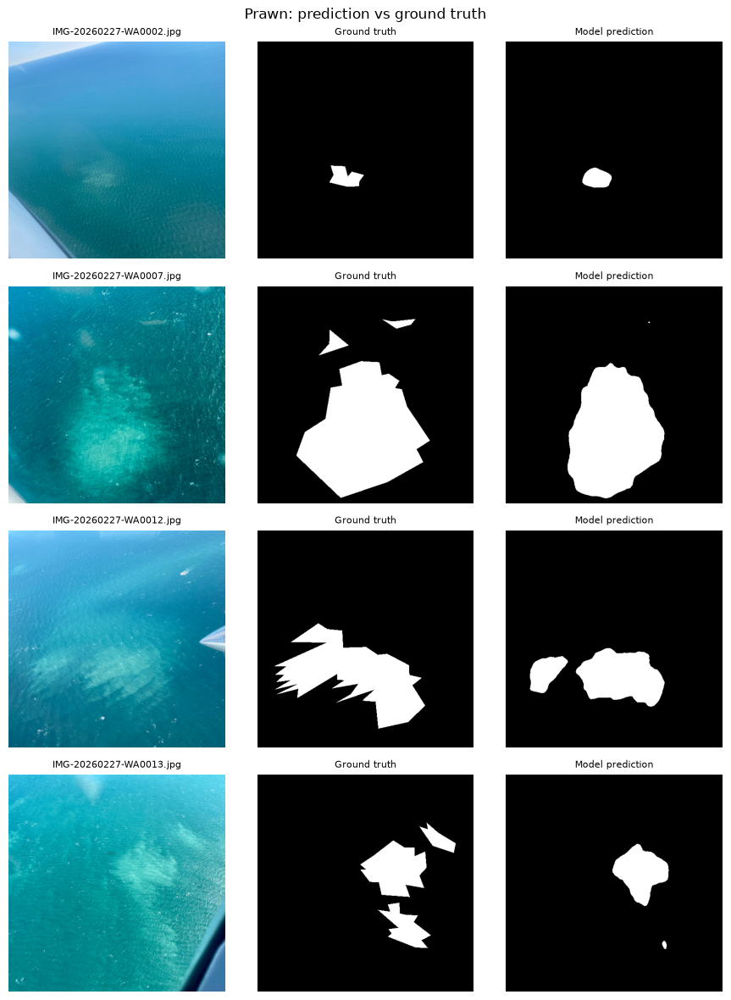

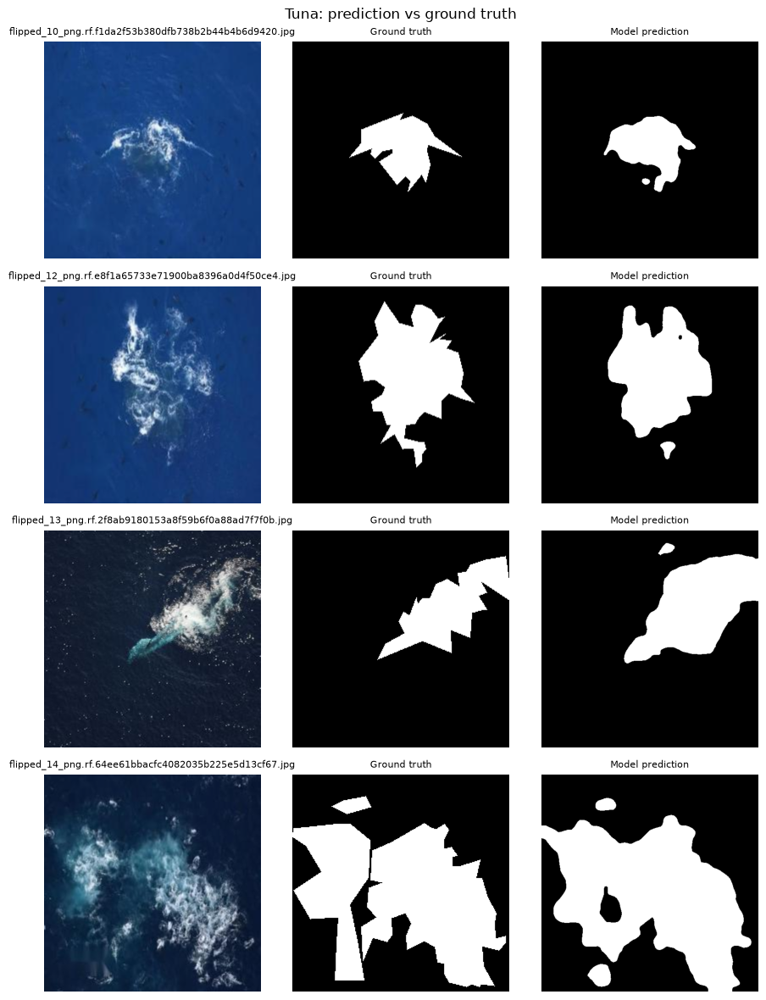

In [12]:
# --- Cell 10: Visualize predicted vs ground-truth masks side by side ---
# Dataset used: prawn_eval_dataset, tuna_eval_dataset.

import matplotlib.pyplot as plt

def visualize_predictions(dataset, n_show=4, title=""):
    model.eval()
    fig, axes = plt.subplots(n_show, 3, figsize=(9, n_show * 3))
    with torch.no_grad():
        for i in range(min(n_show, len(dataset))):
            sample = dataset[i]
            pixel_values = sample["pixel_values"].unsqueeze(0).to(device)
            labels = sample["labels"].numpy()

            outputs = model(pixel_values=pixel_values)
            logits = F.interpolate(outputs.logits, size=labels.shape, mode="bilinear", align_corners=False)
            pred = logits.argmax(dim=1).cpu().numpy()[0]

            img_display = sample["pixel_values"].numpy().transpose(1, 2, 0)
            img_display = (img_display * IMAGENET_STD + IMAGENET_MEAN).clip(0, 1)

            axes[i, 0].imshow(img_display)
            axes[i, 0].set_title(sample["filename"], fontsize=8)
            axes[i, 0].axis("off")

            axes[i, 1].imshow(labels, cmap="gray")
            axes[i, 1].set_title("Ground truth", fontsize=8)
            axes[i, 1].axis("off")

            axes[i, 2].imshow(pred, cmap="gray")
            axes[i, 2].set_title("Model prediction", fontsize=8)
            axes[i, 2].axis("off")

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

visualize_predictions(prawn_eval_dataset, n_show=min(4, len(prawn_eval_dataset)), title="Prawn: prediction vs ground truth")
visualize_predictions(tuna_eval_dataset, n_show=min(4, len(tuna_eval_dataset)), title="Tuna: prediction vs ground truth")

In [13]:
# --- Cell 11: Save the scored summary ---
# Dataset used: results from Cell 9.

summary = {
    "segformer_checkpoint": SEGFORMER_CHECKPOINT,
    "num_epochs": NUM_EPOCHS,
    "img_size": IMG_SIZE,
    "n_train_images": len(train_dataset),
    "n_prawn_train": len(prawn_train_records),
    "n_tuna_train": len(tuna_train_records),
    "n_negative_train": len(negative_records),
    "prawn_model_iou": prawn_model_iou,
    "prawn_human_ceiling": PRAWN_IOU_CEILING,
    "tuna_model_iou": tuna_model_iou,
    "tuna_human_ceiling": TUNA_IOU_CEILING,
}

print(json.dumps(summary, indent=2))

with open(OUTPUT_DIR / "stage2_scored_summary.json", "w") as f:
    json.dump(summary, f, indent=2)

print(f"\nSaved to {OUTPUT_DIR / 'stage2_scored_summary.json'}")

{
  "segformer_checkpoint": "nvidia/segformer-b0-finetuned-ade-512-512",
  "num_epochs": 30,
  "img_size": [
    512,
    512
  ],
  "n_train_images": 468,
  "n_prawn_train": 15,
  "n_tuna_train": 16,
  "n_negative_train": 437,
  "prawn_model_iou": 0.47006470722506943,
  "prawn_human_ceiling": 0.5867,
  "tuna_model_iou": 0.7747601486503152,
  "tuna_human_ceiling": 0.7204
}

Saved to stage2_output\stage2_scored_summary.json


## Checkpoint comparison and negative-control sanity check

Two additions:
1. **Compare saved checkpoints** (epoch 10, 20, 30) against both held-out eval sets, since the
   training loss showed a late instability (epoch 24 spike) - epoch 30 isn't necessarily the best.
2. **Run negative-control images through the trained model** and check how much it predicts -
   ideally close to zero flagged pixels, since this is genuinely clean water.

In [14]:
# --- Cell 12: Compare saved checkpoints on both eval sets ---
# Dataset used: prawn_eval_dataset, tuna_eval_dataset (same held-out 10+10 as Cell 9).
# Loads each saved checkpoint fresh and re-scores it, so you can pick the best
# one objectively instead of assuming the final epoch is best.

checkpoint_paths = sorted(OUTPUT_DIR.glob("segformer_b0_epoch*.pt"))
print(f"Found {len(checkpoint_paths)} checkpoints: {[p.name for p in checkpoint_paths]}")

def evaluate_silent(loader):
    """Same logic as evaluate() in Cell 9, without per-image printing."""
    model.eval()
    ious = []
    with torch.no_grad():
        for batch in loader:
            pixel_values = batch["pixel_values"].to(device)
            labels = batch["labels"].numpy()[0]
            outputs = model(pixel_values=pixel_values)
            logits = F.interpolate(outputs.logits, size=labels.shape, mode="bilinear", align_corners=False)
            pred = logits.argmax(dim=1).cpu().numpy()[0]
            iou = compute_iou_binary(pred, labels)
            if iou is not None:
                ious.append(iou)
    return float(np.mean(ious)) if ious else 0.0

checkpoint_results = []
for ckpt_path in checkpoint_paths:
    model.load_state_dict(torch.load(ckpt_path, map_location=device))
    model.to(device)
    prawn_iou = evaluate_silent(prawn_eval_loader)
    tuna_iou = evaluate_silent(tuna_eval_loader)
    checkpoint_results.append((ckpt_path.name, prawn_iou, tuna_iou))
    print(f"{ckpt_path.name}: prawn IoU = {prawn_iou:.2%}, tuna IoU = {tuna_iou:.2%}")

# Pick the checkpoint with the best COMBINED (average) score across both datasets
best_checkpoint = max(checkpoint_results, key=lambda r: (r[1] + r[2]) / 2)
print(f"\nBest checkpoint by average IoU: {best_checkpoint[0]} "
      f"(prawn={best_checkpoint[1]:.2%}, tuna={best_checkpoint[2]:.2%})")

# Load the best checkpoint back into `model` so subsequent cells use it
best_ckpt_path = OUTPUT_DIR / best_checkpoint[0]
model.load_state_dict(torch.load(best_ckpt_path, map_location=device))
model.to(device)
print(f"Loaded {best_checkpoint[0]} as the active model for the cells below.")

Found 3 checkpoints: ['segformer_b0_epoch10.pt', 'segformer_b0_epoch20.pt', 'segformer_b0_epoch30.pt']
segformer_b0_epoch10.pt: prawn IoU = 46.65%, tuna IoU = 79.91%
segformer_b0_epoch20.pt: prawn IoU = 52.16%, tuna IoU = 77.22%
segformer_b0_epoch30.pt: prawn IoU = 47.01%, tuna IoU = 77.48%

Best checkpoint by average IoU: segformer_b0_epoch20.pt (prawn=52.16%, tuna=77.22%)
Loaded segformer_b0_epoch20.pt as the active model for the cells below.


### Negative-control check

**Important caveat:** the negative images below were part of the 437 used to TRAIN the model
(Cell 4), so this is a sanity check ("does it still recognize the water it learned from?"),
not a true generalization test. For a genuinely unseen check, point `TRUE_HOLDOUT_NEGATIVE_DIR`
below at Stage 1's `baseline_split` folder instead - those images were used to build Stage 1's
statistics but were never shown to this SegFormer model during training.

In [16]:
# --- Cell 13: Run negative-control images through the model ---
# Dataset used: a sample of Stage 1's negative controls. Ideally these produce
# an all-background (empty) prediction, since there is genuinely nothing to flag.

# Optional: point this at Stage 1's baseline_split for a TRUE held-out check
# (never seen during Stage 2 training at all). Leave as None to reuse a sample
# of the training negatives instead (Cell 4's NEGATIVE_DIR).
TRUE_HOLDOUT_NEGATIVE_DIR = None  # e.g. Path(r"C:\...\Stage_01\data\normal_sea\baseline_split")

N_NEGATIVE_CHECK_SAMPLE = 30

if TRUE_HOLDOUT_NEGATIVE_DIR is not None:
    check_dir = TRUE_HOLDOUT_NEGATIVE_DIR
    print(f"Using TRUE held-out negatives from: {check_dir}")
else:
    check_dir = NEGATIVE_DIR
    print(f"WARNING: reusing training negatives from {check_dir} - this is a sanity check, not a generalization test.")

neg_check_paths = list(check_dir.glob("*.jpg")) or list(check_dir.glob("*.png"))
neg_check_paths = random.sample(neg_check_paths, min(N_NEGATIVE_CHECK_SAMPLE, len(neg_check_paths)))

model.eval()
flagged_pixel_counts = []
images_with_any_flag = 0

with torch.no_grad():
    for p in neg_check_paths:
        img = Image.open(p).convert("RGB").resize(IMG_SIZE, Image.BILINEAR)
        img_arr = np.array(img, dtype=np.float32) / 255.0
        img_arr = (img_arr - IMAGENET_MEAN) / IMAGENET_STD
        img_arr = img_arr.transpose(2, 0, 1)
        pixel_values = torch.from_numpy(img_arr).unsqueeze(0).to(device)

        outputs = model(pixel_values=pixel_values)
        logits = F.interpolate(outputs.logits, size=IMG_SIZE, mode="bilinear", align_corners=False)
        pred = logits.argmax(dim=1).cpu().numpy()[0]

        n_flagged = int(pred.sum())
        flagged_pixel_counts.append(n_flagged)
        if n_flagged > 0:
            images_with_any_flag += 1

print(f"\nChecked {len(neg_check_paths)} negative-control images")
print(f"Images with ZERO flagged pixels (ideal outcome): "
      f"{len(neg_check_paths) - images_with_any_flag} / {len(neg_check_paths)} "
      f"({(1 - images_with_any_flag / len(neg_check_paths)):.2%})")
print(f"Average flagged pixels per image: {np.mean(flagged_pixel_counts):.1f} "
      f"(out of {IMG_SIZE[0] * IMG_SIZE[1]:,} total pixels)")
print(f"Max flagged pixels on any single negative image: {max(flagged_pixel_counts)}")


Checked 30 negative-control images
Images with ZERO flagged pixels (ideal outcome): 30 / 30 (100.00%)
Average flagged pixels per image: 0.0 (out of 262,144 total pixels)
Max flagged pixels on any single negative image: 0


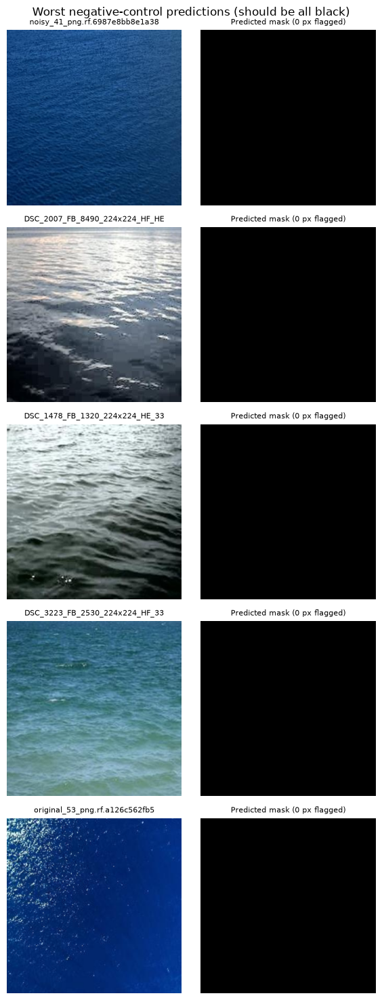

In [17]:
# --- Cell 14: Visualize a few negative-control predictions ---
# Dataset used: same sample as Cell 13. A correct prediction shows an all-black
# (empty) mask in the right-hand panel - any white region is a false positive.

N_TO_SHOW = 5
worst_negatives = sorted(zip(neg_check_paths, flagged_pixel_counts), key=lambda x: -x[1])[:N_TO_SHOW]

fig, axes = plt.subplots(len(worst_negatives), 2, figsize=(6, len(worst_negatives) * 3))
if len(worst_negatives) == 1:
    axes = axes.reshape(1, -1)

with torch.no_grad():
    for i, (p, n_flagged) in enumerate(worst_negatives):
        img = Image.open(p).convert("RGB").resize(IMG_SIZE, Image.BILINEAR)
        img_arr = np.array(img, dtype=np.float32) / 255.0
        img_norm = (img_arr - IMAGENET_MEAN) / IMAGENET_STD
        pixel_values = torch.from_numpy(img_norm.transpose(2, 0, 1)).unsqueeze(0).to(device)

        outputs = model(pixel_values=pixel_values)
        logits = F.interpolate(outputs.logits, size=IMG_SIZE, mode="bilinear", align_corners=False)
        pred = logits.argmax(dim=1).cpu().numpy()[0]

        axes[i, 0].imshow(img_arr)
        axes[i, 0].set_title(p.name[:30], fontsize=8)
        axes[i, 0].axis("off")

        axes[i, 1].imshow(pred, cmap="gray", vmin=0, vmax=1)
        axes[i, 1].set_title(f"Predicted mask ({n_flagged} px flagged)", fontsize=8)
        axes[i, 1].axis("off")

plt.suptitle("Worst negative-control predictions (should be all black)")
plt.tight_layout()
plt.show()

## Full-set outputs: all 25 prawn, all 26 tuna, 30+ negative controls

Runs the (now best-checkpoint) model across the ENTIRE annotated set for each
dataset - not just the 10 held-out eval images - plus a larger negative-control
sample. Ground truth polygons are drawn in **yellow**, the model's predicted
mask is overlaid in **red** (semi-transparent), so agreement/disagreement is
visible directly on each image, 5 per row.

**Note:** the 15 prawn / 16 tuna images that were used in TRAINING will
naturally score higher here than the 10 held-out eval images per dataset -
that's expected (the model has seen them), not a fair generalization measure.
Cell 9's held-out-only numbers remain the honest accuracy figures; this is
for visual inspection across the full set, not a new official score.

In [18]:
# --- Cell 15: Helper functions for full-set inference + visualization ---

import cv2

def run_inference(img_path):
    """Loads an image, runs the model, returns (display_img[0-1 float], pred_mask[0/1])."""
    img = Image.open(img_path).convert("RGB").resize(IMG_SIZE, Image.BILINEAR)
    img_arr = np.array(img, dtype=np.float32) / 255.0
    img_norm = (img_arr - IMAGENET_MEAN) / IMAGENET_STD
    pixel_values = torch.from_numpy(img_norm.transpose(2, 0, 1)).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(pixel_values=pixel_values)
        logits = F.interpolate(outputs.logits, size=IMG_SIZE, mode="bilinear", align_corners=False)
        pred = logits.argmax(dim=1).cpu().numpy()[0]

    return img_arr, pred

def scale_polygon(seg, orig_w, orig_h, target_size):
    """Rescales a flat [x1,y1,x2,y2,...] polygon from the original image size to target_size."""
    xs = np.array(seg[0::2]) * (target_size[0] / orig_w)
    ys = np.array(seg[1::2]) * (target_size[1] / orig_h)
    return list(zip(xs, ys))

def overlay_prediction(ax, img_arr, pred_mask, record=None, iou=None):
    """Draws image + red predicted-mask overlay + yellow ground-truth outline (if record given)."""
    ax.imshow(img_arr)
    red_overlay = np.zeros((*pred_mask.shape, 4))
    red_overlay[pred_mask == 1] = [1, 0, 0, 0.4]
    ax.imshow(red_overlay)

    if record is not None:
        for seg in record["segmentations"]:
            pts = scale_polygon(seg, record["width"], record["height"], IMG_SIZE)
            pts.append(pts[0])
            xs, ys = zip(*pts)
            ax.plot(xs, ys, color="yellow", linewidth=1.5)

    title = record["filename"][:22] + "..." if record else ""
    if iou is not None:
        title += f"\nIoU={iou:.2f}"
    ax.set_title(title, fontsize=7)
    ax.axis("off")

def plot_full_grid(records, cols=5, suptitle=""):
    n_rows = (len(records) + cols - 1) // cols
    fig, axes = plt.subplots(n_rows, cols, figsize=(cols * 3, n_rows * 3.3))
    axes = np.atleast_2d(axes)

    results = []
    for idx in range(n_rows * cols):
        ax = axes[idx // cols][idx % cols]
        if idx < len(records):
            r = records[idx]
            img_arr, pred = run_inference(r["path"])
            gt_mask = np.array(polygons_to_mask(r["width"], r["height"], r["segmentations"]).resize(IMG_SIZE, Image.NEAREST))
            iou = compute_iou_binary(pred, gt_mask)
            results.append((r["filename"], iou))
            overlay_prediction(ax, img_arr, pred, record=r, iou=iou)
        else:
            ax.axis("off")

    plt.suptitle(suptitle)
    plt.tight_layout()
    plt.show()
    return results

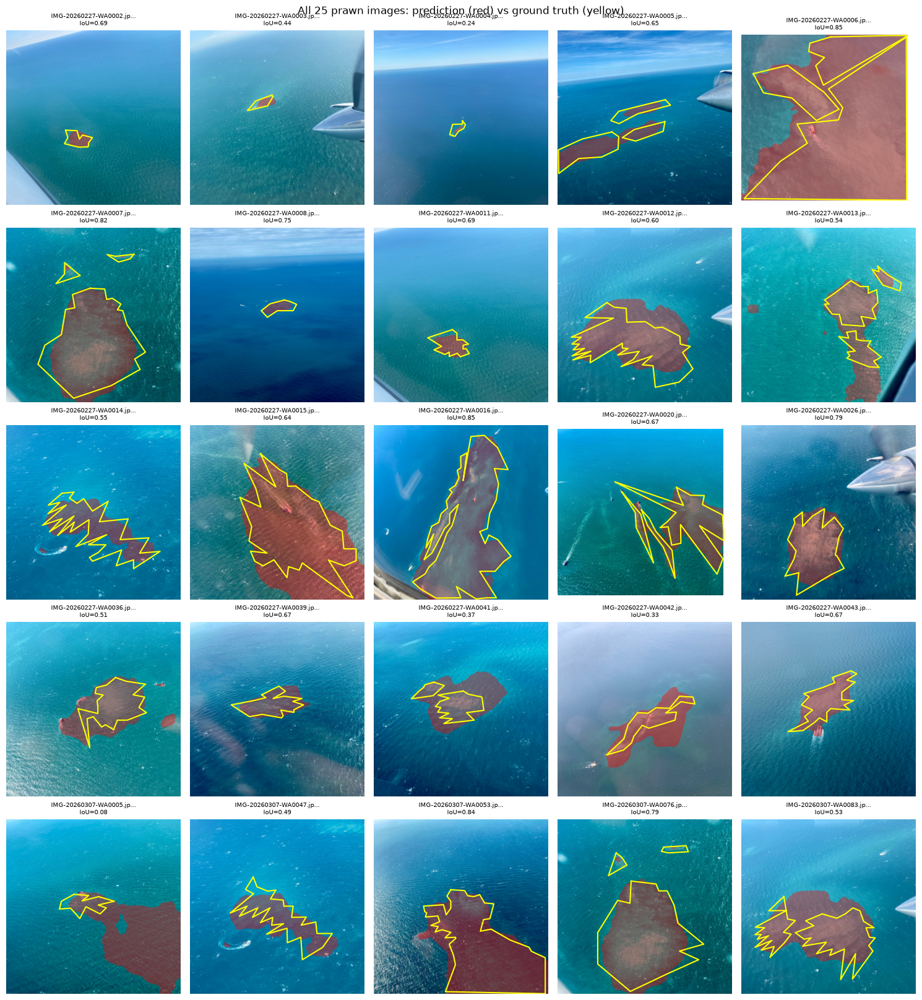

filename                                      |    iou
IMG-20260227-WA0002.jpg                       | 0.690
IMG-20260227-WA0003.jpg                       | 0.441
IMG-20260227-WA0004.jpg                       | 0.239
IMG-20260227-WA0005.jpg                       | 0.651
IMG-20260227-WA0006.jpg                       | 0.847
IMG-20260227-WA0007.jpg                       | 0.823
IMG-20260227-WA0008.jpg                       | 0.745
IMG-20260227-WA0011.jpg                       | 0.693
IMG-20260227-WA0012.jpg                       | 0.596
IMG-20260227-WA0013.jpg                       | 0.538
IMG-20260227-WA0014.jpg                       | 0.549
IMG-20260227-WA0015.jpg                       | 0.641
IMG-20260227-WA0016.jpg                       | 0.852
IMG-20260227-WA0020.jpg                       | 0.674
IMG-20260227-WA0026.jpg                       | 0.786
IMG-20260227-WA0036.jpg                       | 0.511
IMG-20260227-WA0039.jpg                       | 0.673
IMG-20260227-WA0041.jpg    

In [19]:
# --- Cell 16: All 25 prawn images ---
# Dataset used: prawn_t1 (full annotated set - 15 used in training + 10 held-out eval).

prawn_all_results = plot_full_grid(prawn_t1, cols=5, suptitle="All 25 prawn images: prediction (red) vs ground truth (yellow)")

print(f"{'filename':<45} | {'iou':>6}")
for fname, iou in prawn_all_results:
    print(f"{fname:<45} | {iou:.3f}" if iou is not None else f"{fname:<45} |   N/A")
print(f"\nAverage IoU across all 25 prawn images: {np.mean([i for _, i in prawn_all_results if i is not None]):.2%}")

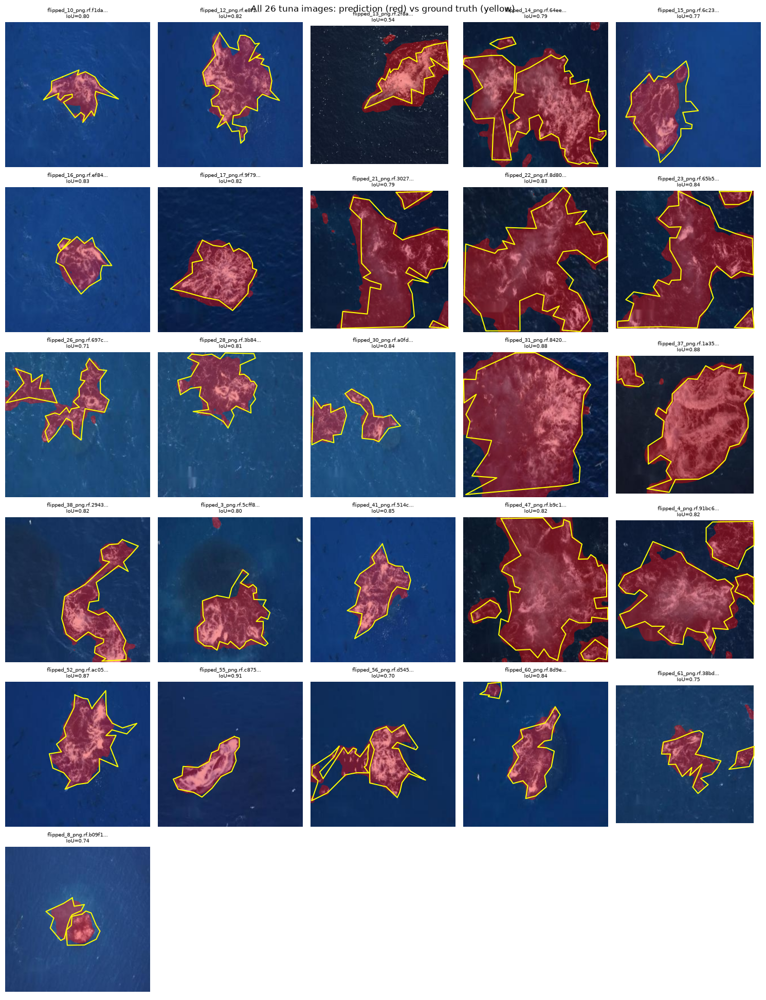

filename                                                |    iou
flipped_10_png.rf.f1da2f53b380dfb738b2b44b4b6d9420.jpg  | 0.800
flipped_12_png.rf.e8f1a65733e71900ba8396a0d4f50ce4.jpg  | 0.822
flipped_13_png.rf.2f8ab9180153a8f59b6f0a88ad7f7f0b.jpg  | 0.538
flipped_14_png.rf.64ee61bbacfc4082035b225e5d13cf67.jpg  | 0.789
flipped_15_png.rf.6c23fd8f1ddabcafc690344d1a2d496f.jpg  | 0.767
flipped_16_png.rf.ef84f116359c6c579db24fc63daca28a.jpg  | 0.829
flipped_17_png.rf.9f79c526188abb49b267ac462e3bd989.jpg  | 0.818
flipped_21_png.rf.3027a4e57e281d2f258fe711068b34af.jpg  | 0.794
flipped_22_png.rf.8d809f5e6800c6f6a15049d39e216da3.jpg  | 0.832
flipped_23_png.rf.65b5b8e10b12d3cf0ee6a4ac538b980b.jpg  | 0.841
flipped_26_png.rf.697c7aa40139ee8caf35242bbc3e5c6e.jpg  | 0.709
flipped_28_png.rf.3b843199566e70fa0a0ae04090220ea4.jpg  | 0.813
flipped_30_png.rf.a0fd45764ce866ef9a04f3c8a56bb3d7.jpg  | 0.838
flipped_31_png.rf.842075409849fc728b5def18bafce22c.jpg  | 0.879
flipped_37_png.rf.1a35ba04eecdbdba8100a

In [20]:
# --- Cell 17: All 26 tuna images ---
# Dataset used: tuna_t1 (full annotated set - 16 used in training + 10 held-out eval).

tuna_all_results = plot_full_grid(tuna_t1, cols=5, suptitle="All 26 tuna images: prediction (red) vs ground truth (yellow)")

print(f"{'filename':<55} | {'iou':>6}")
for fname, iou in tuna_all_results:
    print(f"{fname:<55} | {iou:.3f}" if iou is not None else f"{fname:<55} |   N/A")
print(f"\nAverage IoU across all 26 tuna images: {np.mean([i for _, i in tuna_all_results if i is not None]):.2%}")

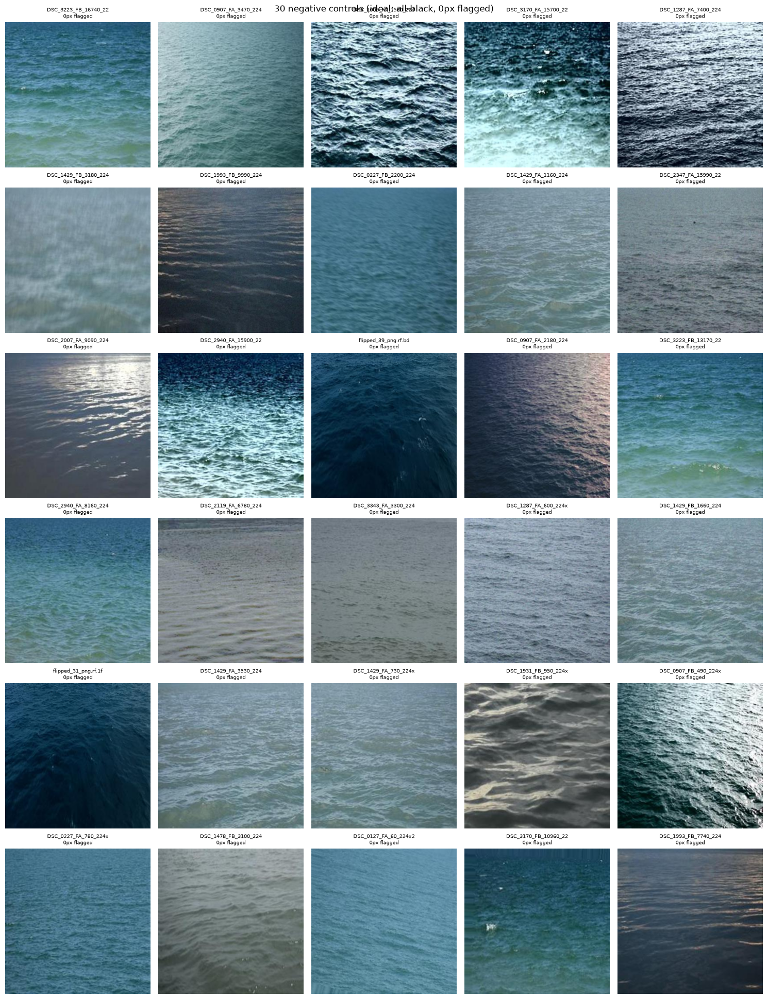


30 / 30 images had ZERO flagged pixels (100.00%)
Average flagged pixels per image: 0.0
Worst (most falsely flagged): ('DSC_3223_FB_16740_224x224_331x331_JPG.rf.9c03f8c968ef8dac452528b72fcfe953.jpg', 0)


In [21]:
# --- Cell 18: At least 30 negative-control images ---
# Dataset used: sample from NEGATIVE_DIR (or TRUE_HOLDOUT_NEGATIVE_DIR from Cell 13 if set).
# No ground truth outline is drawn (there is nothing to outline) - ideal result
# is an all-black overlay (zero red pixels) on every image.

N_NEGATIVES_TO_SHOW = 30

neg_dir_to_use = TRUE_HOLDOUT_NEGATIVE_DIR if TRUE_HOLDOUT_NEGATIVE_DIR is not None else NEGATIVE_DIR
neg_show_paths = list(neg_dir_to_use.glob("*.jpg")) or list(neg_dir_to_use.glob("*.png"))
neg_show_paths = random.sample(neg_show_paths, min(N_NEGATIVES_TO_SHOW, len(neg_show_paths)))

neg_records_for_grid = [{"path": p, "filename": p.name, "width": None, "height": None, "segmentations": []} for p in neg_show_paths]

n_rows = (len(neg_records_for_grid) + 4) // 5
fig, axes = plt.subplots(n_rows, 5, figsize=(15, n_rows * 3.3))
axes = np.atleast_2d(axes)

flagged_counts = []
for idx in range(n_rows * 5):
    ax = axes[idx // 5][idx % 5]
    if idx < len(neg_records_for_grid):
        r = neg_records_for_grid[idx]
        img_arr, pred = run_inference(r["path"])
        n_flagged = int(pred.sum())
        flagged_counts.append((r["filename"], n_flagged))
        overlay_prediction(ax, img_arr, pred, record=None, iou=None)
        ax.set_title(f"{r['filename'][:20]}\n{n_flagged}px flagged", fontsize=7)
    else:
        ax.axis("off")

plt.suptitle(f"{len(neg_records_for_grid)} negative controls (ideal: all-black, 0px flagged)")
plt.tight_layout()
plt.show()

n_clean = sum(1 for _, n in flagged_counts if n == 0)
print(f"\n{n_clean} / {len(flagged_counts)} images had ZERO flagged pixels "
      f"({n_clean / len(flagged_counts):.2%})")
print(f"Average flagged pixels per image: {np.mean([n for _, n in flagged_counts]):.1f}")
print(f"Worst (most falsely flagged): {max(flagged_counts, key=lambda x: x[1])}")